In [222]:
import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings(action='ignore')
import matplotlib.pyplot as plt
import seaborn as sns
pd.options.display.max_columns = None
pd.options.display.max_rows = None

In [223]:
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.graphics.gofplots import qqplot

In [224]:
from sklearn.preprocessing import PowerTransformer,MinMaxScaler
from sklearn.model_selection import train_test_split,cross_val_score,KFold,GridSearchCV

from sklearn.linear_model import LinearRegression,Ridge,Lasso

from sklearn.metrics import r2_score,mean_squared_error

# Data Understanding

In [225]:
df_house = pd.read_csv('train.csv',encoding='utf-8')
df_house.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [226]:
df_house.shape

(1460, 81)

In [227]:
# There are 1460 rows and 81 columns

In [228]:
df_house.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [229]:
df_house.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [230]:
df_house.describe(include='object')

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
count,1460,1460,91,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1452,1460,1460,1460,1423,1423,1422,1423,1422,1460,1460,1460,1459,1460,1460,770,1379,1379,1379,1379,1460,7,281,54,1460,1460
unique,5,2,2,4,4,2,5,3,25,9,8,5,8,6,8,15,16,4,4,5,6,4,4,4,6,6,6,5,2,5,4,7,5,6,3,5,5,3,3,4,4,9,6
top,RL,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,None,TA,TA,PConc,TA,TA,No,Unf,Unf,GasA,Ex,Y,SBrkr,TA,Typ,Gd,Attchd,Unf,TA,TA,Y,Gd,MnPrv,Shed,WD,Normal
freq,1151,1454,50,925,1311,1459,1052,1382,225,1260,1445,1220,726,1141,1434,515,504,864,906,1282,647,649,1311,953,430,1256,1428,741,1365,1334,735,1360,380,870,605,1311,1326,1340,3,157,49,1267,1198


In [231]:
df_house[df_house.duplicated()]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice


In [232]:
# there is no duplicate values in the data set

In [233]:
df_house.isnull().mean()*100

Id                0.000000
MSSubClass        0.000000
MSZoning          0.000000
LotFrontage      17.739726
LotArea           0.000000
Street            0.000000
Alley            93.767123
LotShape          0.000000
LandContour       0.000000
Utilities         0.000000
LotConfig         0.000000
LandSlope         0.000000
Neighborhood      0.000000
Condition1        0.000000
Condition2        0.000000
BldgType          0.000000
HouseStyle        0.000000
OverallQual       0.000000
OverallCond       0.000000
YearBuilt         0.000000
YearRemodAdd      0.000000
RoofStyle         0.000000
RoofMatl          0.000000
Exterior1st       0.000000
Exterior2nd       0.000000
MasVnrType        0.547945
MasVnrArea        0.547945
ExterQual         0.000000
ExterCond         0.000000
Foundation        0.000000
BsmtQual          2.534247
BsmtCond          2.534247
BsmtExposure      2.602740
BsmtFinType1      2.534247
BsmtFinSF1        0.000000
BsmtFinType2      2.602740
BsmtFinSF2        0.000000
B

In [234]:
df_house.isnull().mean().sort_values(ascending=False)*100

PoolQC           99.520548
MiscFeature      96.301370
Alley            93.767123
Fence            80.753425
FireplaceQu      47.260274
LotFrontage      17.739726
GarageYrBlt       5.547945
GarageCond        5.547945
GarageType        5.547945
GarageFinish      5.547945
GarageQual        5.547945
BsmtFinType2      2.602740
BsmtExposure      2.602740
BsmtQual          2.534247
BsmtCond          2.534247
BsmtFinType1      2.534247
MasVnrArea        0.547945
MasVnrType        0.547945
Electrical        0.068493
Id                0.000000
Functional        0.000000
Fireplaces        0.000000
KitchenQual       0.000000
KitchenAbvGr      0.000000
BedroomAbvGr      0.000000
HalfBath          0.000000
FullBath          0.000000
BsmtHalfBath      0.000000
TotRmsAbvGrd      0.000000
GarageCars        0.000000
GrLivArea         0.000000
GarageArea        0.000000
PavedDrive        0.000000
WoodDeckSF        0.000000
OpenPorchSF       0.000000
EnclosedPorch     0.000000
3SsnPorch         0.000000
S

In [235]:
df_house.nunique()

Id               1460
MSSubClass         15
MSZoning            5
LotFrontage       110
LotArea          1073
Street              2
Alley               2
LotShape            4
LandContour         4
Utilities           2
LotConfig           5
LandSlope           3
Neighborhood       25
Condition1          9
Condition2          8
BldgType            5
HouseStyle          8
OverallQual        10
OverallCond         9
YearBuilt         112
YearRemodAdd       61
RoofStyle           6
RoofMatl            8
Exterior1st        15
Exterior2nd        16
MasVnrType          4
MasVnrArea        327
ExterQual           4
ExterCond           5
Foundation          6
BsmtQual            4
BsmtCond            4
BsmtExposure        4
BsmtFinType1        6
BsmtFinSF1        637
BsmtFinType2        6
BsmtFinSF2        144
BsmtUnfSF         780
TotalBsmtSF       721
Heating             6
HeatingQC           5
CentralAir          2
Electrical          5
1stFlrSF          753
2ndFlrSF          417
LowQualFin

In [236]:
df_house.drop(['Id','PoolQC','MiscFeature','Alley','Fence'],axis=1,inplace=True)

In [237]:
# Alley,PoolQC,MiscFeature having more than 90% missing value while Fence have 80% missing value so we can drop them
# Id column is not significant variable as it is not contributing much in the model

# Exploratory Data Analysis

# Univariate Analysis

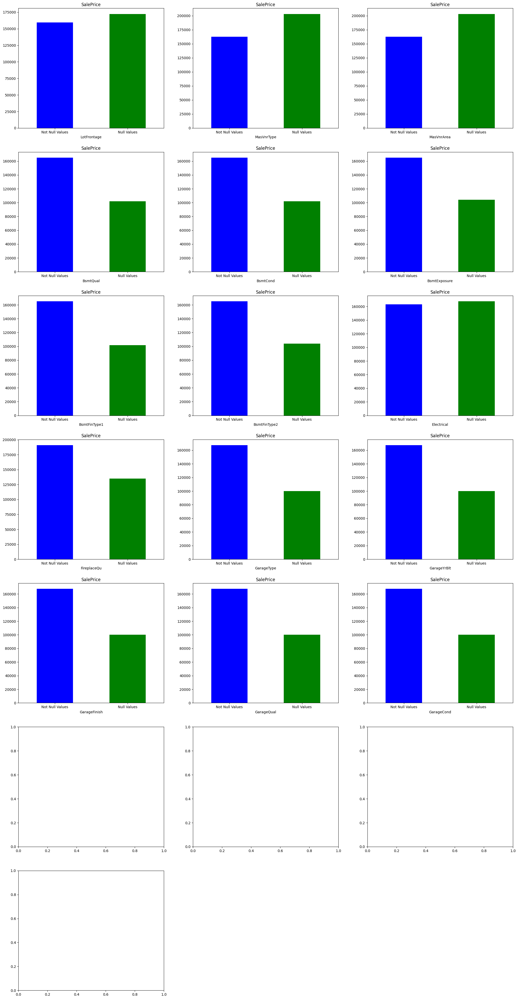

In [238]:
nan_col = []

for i in df_house.columns:
    if df_house[i].isnull().sum() > 0:
        nan_col.append(i)
df_house_copy = df_house.copy()
fig,axs = plt.subplots(nrows=7,ncols=3,figsize=(25,50),squeeze=True)
for col,ax in zip(nan_col,axs.flatten()):
        df_house_copy[col] = np.where(df_house_copy[col].isnull(),'Null Values','Not Null Values')
        df_house_copy.groupby(by=col)['SalePrice'].median().plot.bar(color = list('bg'),rot=0,ax=ax,subplots=True)
axs[6,1].set_axis_off()
axs[6,2].set_axis_off()
plt.show()   

In [239]:
# Nan values have some impact on sales price so we need to impute them later on

In [240]:
print("Number of Numerical column is ",len(df_house.select_dtypes(exclude='object').columns))
print("Number of Categorical column is ",len(df_house.select_dtypes(include='object').columns))

Number of Numerical column is  37
Number of Categorical column is  39


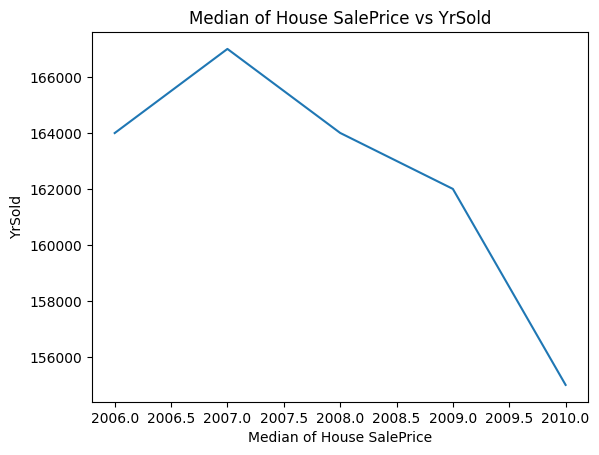

In [241]:
# Chekcing if the median price changes with the year sold
df_house.groupby('YrSold')['SalePrice'].median().plot()
plt.xlabel('Median of House SalePrice')
plt.ylabel('YrSold')
plt.title('Median of House SalePrice vs YrSold')
plt.show()

In [242]:
df_house.columns

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
       'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle',
       'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd',
       'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond',
       'PavedDrive', 'WoodDeckSF'

In [243]:
yr_col = []

for i in df_house.columns:
    if 'Yr' in i or 'Year' in i or 'year' in i or 'yr' in i:
        yr_col.append(i)
yr_col

['YearBuilt', 'YearRemodAdd', 'GarageYrBlt', 'YrSold']

In [244]:
# It looks like that the new properties are costlier than the old properties.

MSSubClass        1.407657
LotFrontage       2.163569
LotArea          12.207688
OverallQual       0.216944
OverallCond       0.693067
YearBuilt        -0.613461
YearRemodAdd     -0.503562
MasVnrArea        2.669084
BsmtFinSF1        1.685503
BsmtFinSF2        4.255261
BsmtUnfSF         0.920268
TotalBsmtSF       1.524255
1stFlrSF          1.376757
2ndFlrSF          0.813030
LowQualFinSF      9.011341
GrLivArea         1.366560
BsmtFullBath      0.596067
BsmtHalfBath      4.103403
FullBath          0.036562
HalfBath          0.675897
BedroomAbvGr      0.211790
KitchenAbvGr      4.488397
TotRmsAbvGrd      0.676341
Fireplaces        0.649565
GarageYrBlt      -0.649415
GarageCars       -0.342549
GarageArea        0.179981
WoodDeckSF        1.541376
OpenPorchSF       2.364342
EnclosedPorch     3.089872
3SsnPorch        10.304342
ScreenPorch       4.122214
PoolArea         14.828374
MiscVal          24.476794
MoSold            0.212053
YrSold            0.096269
SalePrice         1.882876
d

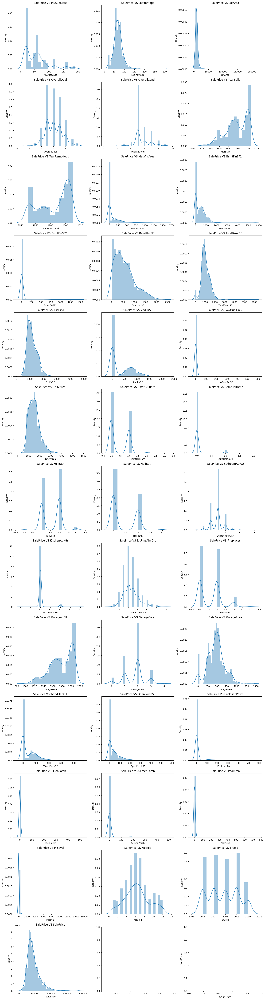

In [245]:
df_house_num = df_house.select_dtypes(exclude='object')
print(df_house_num.skew())
fig,axs = plt.subplots(nrows=13,ncols=3,figsize=(20,80))

for col,ax in zip(df_house_num.columns,axs.flatten()):
    sns.distplot(a=df_house_num[col],ax=ax)
    plt.xlabel(col,fontsize=12)
    plt.ylabel('SalePrice',fontsize=12)
    ax.set_title('SalePrice '+'VS '+str(col))
plt.show()

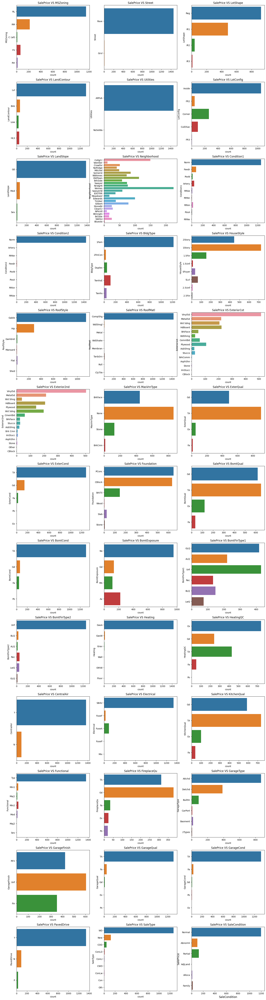

In [246]:
df_house_cat = df_house.select_dtypes(include = 'object')

fig,axs = plt.subplots(nrows=13,ncols=3,figsize=(20,80))

for col,ax in zip(df_house_cat.columns,axs.flatten()):
    sns.countplot(y=df_house_cat[col],ax=ax)
    plt.xlabel(col,fontsize=12)
    plt.ylabel('SalePrice',fontsize=12)
    ax.set_title('SalePrice '+'VS '+str(col))
plt.show()

In [247]:
# We can see that columns utilies,street are highly imbalance

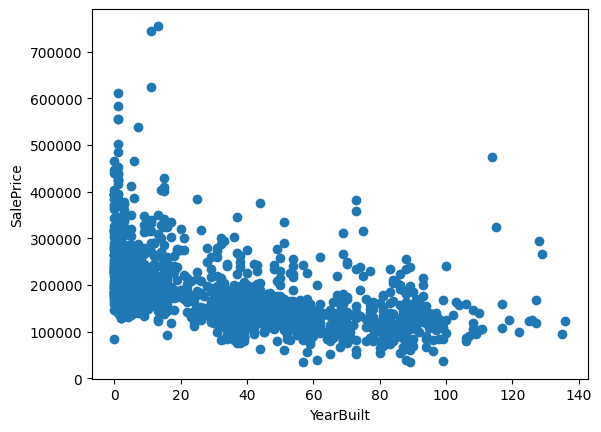

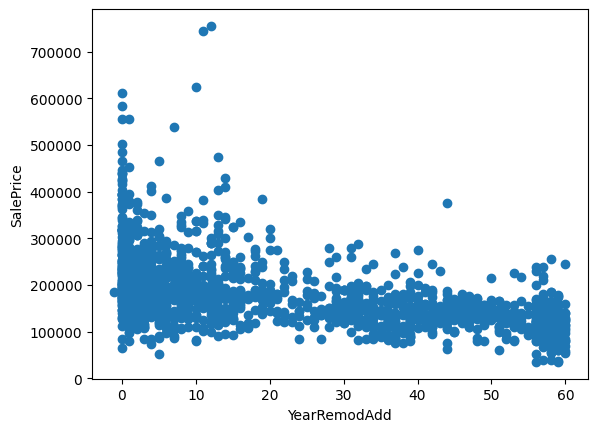

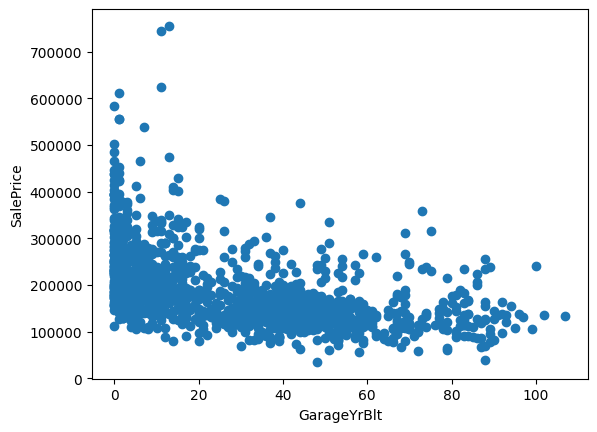

In [248]:
for col in yr_col:
    if col != 'YrSold':
        data = df_house.copy()
        data[col] = df_house['YrSold'] - df_house[col]
        plt.scatter(data[col],data['SalePrice'])
        plt.xlabel(col)
        plt.ylabel('SalePrice')
        plt.show()

# Bivariate Analysis

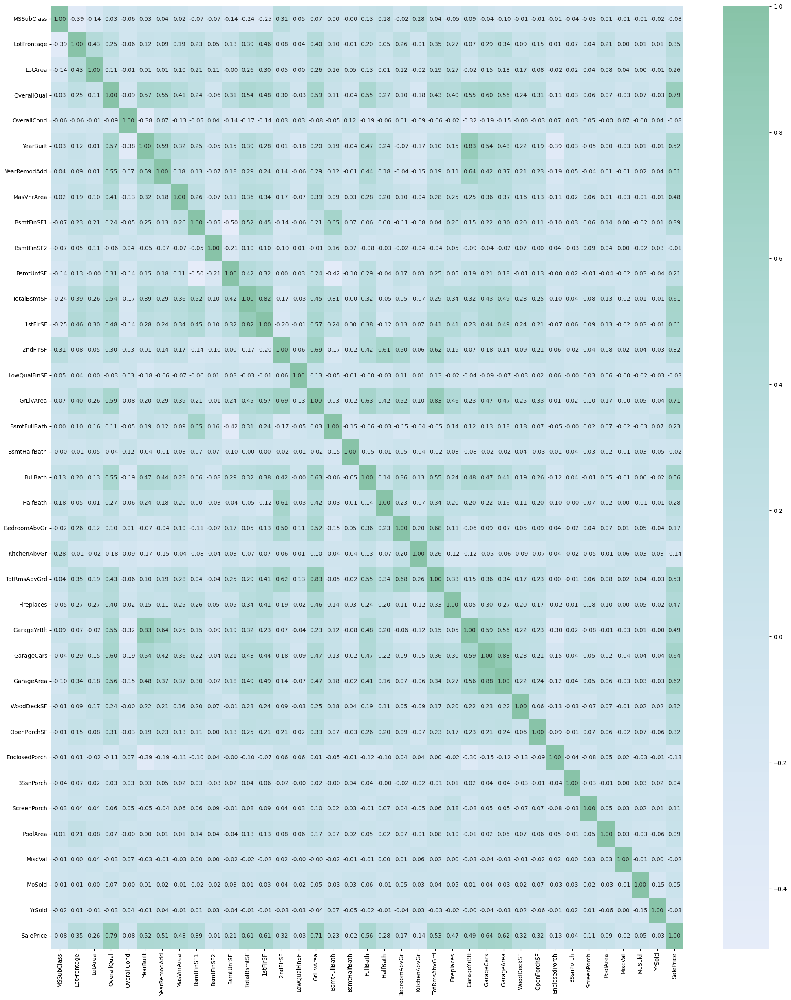

In [249]:
plt.figure(figsize=(25,30))
sns.heatmap(df_house.corr(),annot=True,center=0,fmt='.2f',cmap=sns.cubehelix_palette(n_colors=3,start=2,gamma=0.2,as_cmap=True))
plt.show()

In [250]:
# we can see that there are independent variables that are highly correlated so there is chance of multicollinearity

# Multivariate Analysis

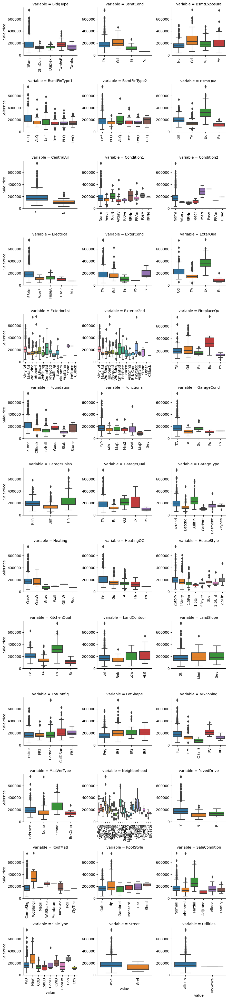

In [251]:
# Plotting Categorical Features with Sale Price
def facetgrid_boxplot(x, y, **kwargs):
    sns.boxplot(x=x, y=y)
    x=plt.xticks(rotation=90)
    
categorical = df_house.select_dtypes(exclude=['int64','float64'])
f = pd.melt(df_house, id_vars=['SalePrice'], value_vars=sorted(df_house[categorical.columns]))
g = sns.FacetGrid(f, col="variable", col_wrap=3, sharex=False, sharey=False)
g = g.map(facetgrid_boxplot, "value", "SalePrice")

In [252]:
# There is oultliers present in the data
# House having higher height of the basement have higher price
# House having good kitchen quality have higher price
# Houses with good and excelent garages are sold at higher prices.
# Houses with good and excelent condition of the material on the exterior are sold at higher prices.
# Paved alleys properties demand a higher price

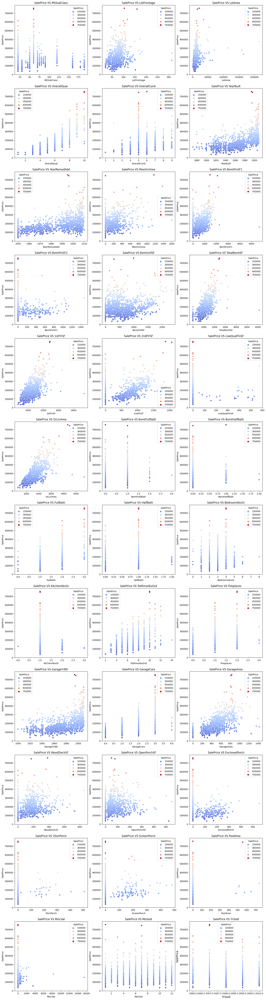

In [253]:
fig,axs = plt.subplots(nrows=12,ncols=3,figsize=(20,80))

for col,ax in zip(df_house_num.columns,axs.flatten()):
    sns.scatterplot(data=df_house_num,x=col,y='SalePrice',ax=ax,hue='SalePrice',palette='coolwarm')
    plt.xlabel(col,fontsize=12)
    plt.ylabel('SalePrice',fontsize=12)
    ax.set_title('SalePrice '+'VS '+str(col))
plt.show()

In [254]:
# new property is costlier than older property.
# there is linear relation between GrLivArea and price
# there is no relationship between price and month
# Total basement area, which is linearly related with the total living area, 
# also is directly proportional to the price of the property.

# Data Preparation

# Feature Engineering

In [255]:
# Creating a new Column to determine the age of the property
df_house['Age'] = df_house['YrSold'] - df_house['YearBuilt']
df_house['Garage_age'] = df_house['YrSold'] - df_house['GarageYrBlt']
df_house['Remodel_age'] = df_house['YrSold'] - df_house['YearRemodAdd']
df_house.drop('GarageYrBlt',axis=1,inplace=True)

In [256]:
df_house.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Age,Garage_age,Remodel_age
0,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,208500,5,5.0,5
1,20,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,0,5,2007,WD,Normal,181500,31,31.0,31
2,60,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,0,9,2008,WD,Normal,223500,7,7.0,6
3,70,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,0,2,2006,WD,Abnorml,140000,91,8.0,36
4,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,12,2008,WD,Normal,250000,8,8.0,8


# Handling missing values

In [257]:
#Instead of dropping rows or columns, we impute the NaN values with None,
# Default or similar values, since by intuion it is assumed that when a certain feature is missing in that property, 
#it is left blank during data collection

In [258]:
df_house.isna().sum()

MSSubClass         0
MSZoning           0
LotFrontage      259
LotArea            0
Street             0
LotShape           0
LandContour        0
Utilities          0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         8
MasVnrArea         8
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinSF1         0
BsmtFinType2      38
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         1
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath       0
BsmtHalfBath       0
FullBath     

In [259]:
df_house['MasVnrType'].fillna('None',inplace=True)
df_house['BsmtCond'].fillna('None',inplace=True)
df_house['BsmtQual'].fillna('None',inplace=True)
df_house['BsmtExposure'].fillna('None',inplace=True)
df_house['BsmtFinType1'].fillna('None',inplace=True)
df_house['BsmtFinType2'].fillna('None',inplace=True)
df_house['GarageType'].fillna('None',inplace=True)
df_house['GarageQual'].fillna('None',inplace=True)
df_house['GarageCond'].fillna('None',inplace=True)
df_house['Garage_age'].fillna('None',inplace=True)
df_house['FireplaceQu'].fillna('None',inplace=True)
df_house['GarageFinish'].fillna('None',inplace=True)

In [260]:
df_house['LotFrontage'] = df_house.groupby('Neighborhood')['LotFrontage'].transform(lambda x:x.fillna(x.median()))

In [261]:
df_house['Electrical'] = df_house['Electrical'].fillna(df_house['Electrical'].mode()[0])

In [262]:
df_house.isna().sum()

MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       8
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
KitchenQual      0
TotRmsAbvGrd

# Dropping imbalance columns

In [263]:
# checking and dropping the imbalance data since it may create bias in our model

In [264]:
for i in df_house_cat.columns:
    print(df_house_cat[i].value_counts())
    print('*'*50)

RL         1151
RM          218
FV           65
RH           16
C (all)      10
Name: MSZoning, dtype: int64
**************************************************
Pave    1454
Grvl       6
Name: Street, dtype: int64
**************************************************
Reg    925
IR1    484
IR2     41
IR3     10
Name: LotShape, dtype: int64
**************************************************
Lvl    1311
Bnk      63
HLS      50
Low      36
Name: LandContour, dtype: int64
**************************************************
AllPub    1459
NoSeWa       1
Name: Utilities, dtype: int64
**************************************************
Inside     1052
Corner      263
CulDSac      94
FR2          47
FR3           4
Name: LotConfig, dtype: int64
**************************************************
Gtl    1382
Mod      65
Sev      13
Name: LandSlope, dtype: int64
**************************************************
NAmes      225
CollgCr    150
OldTown    113
Edwards    100
Somerst     86
Gilbert     79
Nr

In [265]:
def im_balance_feature(df):
    imbalance_col = []
    for i in df.columns:
        counts = df[i].value_counts()
        col_max = counts.iloc[0]
        if col_max/len(df)*100 >  99:
            imbalance_col.append(i)
    return imbalance_col

In [266]:
imbalance_col = im_balance_feature(df_house)
df_house.drop(imbalance_col,axis=1,inplace=True)

# Handling Outliers 

In [267]:
# there were some ouliers present in below columns which we saw in EDA
# GrLivArea,GarageArea,TotalBsmtSF,LotArea

In [268]:
def remove_outliers(x):
    list1 = []
    outl_col = ['GrLivArea','GarageArea','TotalBsmtSF','LotArea']
    for col in outl_col:
        Q1 = x[col].quantile(0.25)
        Q3 = x[col].quantile(0.99)
        IQR = Q3-Q1
        x = x[(x[col] >= (Q1-(1.5*IQR))) & (x[col] <= (Q3+(1.5*IQR)))]
    return x
df_house_IQR = remove_outliers(df_house)
df_house_IQR.reset_index(drop=True,inplace=True)
df_house_IQR.shape

(1455, 75)

# Feature Engineering

In [269]:
# Feature Engineering to create new column based on existing features

In [270]:
df_house_IQR.head(1)

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Age,Garage_age,Remodel_age
0,60,RL,65.0,8450,Reg,Lvl,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,None,Attchd,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,2,2008,WD,Normal,208500,5,5.0,5


In [271]:
#Overall area for all floors and basement plays an important role, hence creating total area in square foot column
df_house['Total_square'] = (df_house['BsmtFinSF1'] + df_house['BsmtFinSF2'] + df_house['1stFlrSF'] + df_house['2ndFlrSF'])

# Creating derived column for total number of bathrooms column
df_house['Total_Bathrooms'] = (df_house['FullBath'] + (0.5 * df_house['HalfBath']) + df_house['BsmtFullBath'] + (0.5 * df_house['BsmtHalfBath']))

#Creating derived column for total porch area 
df_house['Total_porch'] = (df_house['OpenPorchSF'] + df_house['3SsnPorch'] + df_house['EnclosedPorch'] + df_house['ScreenPorch'] + df_house['WoodDeckSF'])

# Encoding the categorical

In [272]:
df_house_IQR_num = df_house_IQR.select_dtypes(exclude='object')
df_house_IQR_cat = df_house_IQR.select_dtypes(include='object')
# df_house_IQR_num.reset_index(drop=True,inplace=True)
df_house_IQR_cat = pd.get_dummies(data=df_house_IQR_cat)
# df_house_IQR_cat.reset_index(drop=True,inplace=True)
df_house_IQR_full = pd.concat([df_house_IQR_num,df_house_IQR_cat],axis=1)
df_house_IQR_full.head()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,MiscVal,MoSold,YrSold,SalePrice,Age,Remodel_age,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Gtl,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Artery,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Flat,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsbShng,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsbShng,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Ex,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Ex,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Ex,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_None,BsmtQual_TA,BsmtCond_Fa,BsmtCond_Gd,BsmtCond_None,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Av,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_None,BsmtFinType1_ALQ,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_None,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_ALQ,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_None,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_Floor,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Ex,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_N,CentralAir_Y,Electrical_FuseA,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Ex,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj1,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Ex,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_None,FireplaceQu_Po,FireplaceQu_TA,GarageType_2Types,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_None,GarageFinish_Fin,GarageFinish_None,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Ex,GarageQ

In [273]:
X = df_house_IQR_full.drop('SalePrice',axis=1)
y = df_house_IQR_full['SalePrice']

In [274]:
# Checking co-related features
corr = X.corr()
corr1 = corr[abs(corr)>=.6]
corr2 =  corr.where(~np.tril(np.ones(corr.shape)).astype(np.bool))  #To remove repetition and 1 correlations
corr_result = corr2.stack()
print(corr_result[(abs(corr_result) > 0.6)])

MSSubClass             BldgType_1Fam           -0.816893
OverallQual            GarageCars               0.602025
                       ExterQual_TA            -0.647338
YearBuilt              Age                     -0.999036
                       Foundation_PConc         0.651122
                       BsmtQual_TA             -0.632578
YearRemodAdd           Remodel_age             -0.997926
MasVnrArea             MasVnrType_None         -0.686775
BsmtFinSF1             BsmtFullBath             0.655652
                       BsmtFinType1_Unf        -0.653551
BsmtFinSF2             BsmtFinType2_Unf        -0.715721
BsmtUnfSF              BsmtFinType1_Unf         0.602664
TotalBsmtSF            1stFlrSF                 0.806004
2ndFlrSF               GrLivArea                0.696988
                       HalfBath                 0.609557
                       TotRmsAbvGrd             0.616788
                       HouseStyle_1Story       -0.788871
                       HouseSty

In [275]:
corr

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,MiscVal,MoSold,YrSold,Age,Remodel_age,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Gtl,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Artery,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Flat,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsbShng,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsbShng,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Ex,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Ex,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Ex,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_None,BsmtQual_TA,BsmtCond_Fa,BsmtCond_Gd,BsmtCond_None,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Av,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_None,BsmtFinType1_ALQ,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_None,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_ALQ,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_None,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_Floor,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Ex,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_N,CentralAir_Y,Electrical_FuseA,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Ex,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj1,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Ex,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_None,FireplaceQu_Po,FireplaceQu_TA,GarageType_2Types,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_None,GarageFinish_Fin,GarageFinish_None,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Ex,GarageQual_Fa,Gar

In [276]:
X.drop(["MSSubClass","OverallQual","YearBuilt","YearRemodAdd","MasVnrArea","BsmtFinSF1","BsmtFinSF2","BsmtUnfSF",
        "TotalBsmtSF","2ndFlrSF","GrLivArea","HalfBath","BedroomAbvGr","KitchenAbvGr","Fireplaces","GarageCars","Age",
        "MSZoning_FV","MSZoning_RL","LotShape_IR1","LandContour_Bnk","LotConfig_Corner","LandSlope_Gtl","Neighborhood_NPkVill",
        "Condition1_Feedr","Condition2_Feedr","Condition2_RRAe","BldgType_1Fam","HouseStyle_1Story","RoofStyle_Flat",
        "RoofStyle_Gable","RoofMatl_CompShg","Exterior1st_AsbShng","Exterior1st_BrkFace","Exterior1st_CBlock",
        "Exterior1st_CemntBd","Exterior1st_HdBoard","Exterior1st_MetalSd","Exterior1st_Plywood","Exterior1st_Stucco",
        "Exterior1st_VinylSd","Exterior1st_Wd Sdng","MasVnrType_BrkFace","ExterQual_Gd","ExterQual_TA","ExterCond_Gd",
        "Foundation_CBlock","Foundation_PConc","Foundation_Slab","BsmtQual_Gd","BsmtQual_None","BsmtCond_Gd","BsmtCond_None",
        "BsmtCond_Po","BsmtExposure_None","BsmtFinType1_None","Heating_GasA","HeatingQC_Ex","CentralAir_N","Electrical_FuseA",
        "KitchenQual_Gd","GarageType_Attchd","GarageType_Detchd","GarageType_None","GarageFinish_None","GarageQual_Ex",
        "GarageQual_None","GarageQual_Po","GarageQual_TA","GarageCond_None","GarageCond_TA","PavedDrive_N"
        ,"SaleType_New","SaleType_WD","SaleCondition_Normal","SaleCondition_Partial"],
         axis=1,inplace=True)

In [277]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=100)
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(1018, 306)
(1018,)
(437, 306)
(437,)


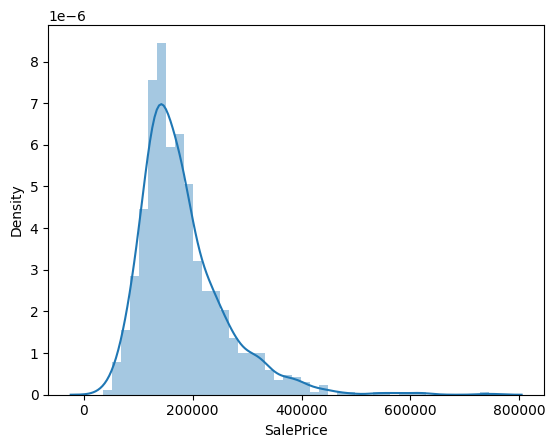

In [278]:
sns.distplot(y_train)
plt.show()

In [279]:
# target column is not normally distributed. It is right skewed.
# we need to transformed the target column

In [280]:
pt = PowerTransformer(method='box-cox',standardize=False)
y_train = pt.fit_transform(y_train.to_frame())
y_test = pt.transform(y_test.to_frame())

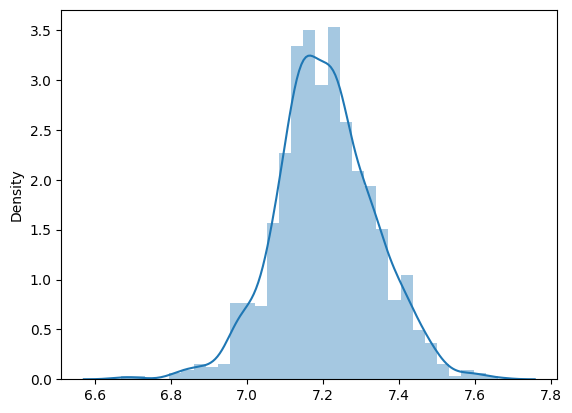

In [281]:
sns.distplot(y_train)
plt.show()

In [282]:
# We have transformed the target columns

In [283]:
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_train_scaled = pd.DataFrame(X_train_scaled)
X_train_scaled.columns = X.columns
X_test_scaled = scaler.transform(X_test)
X_test_scaled = pd.DataFrame(X_test_scaled)
X_test_scaled.columns = X.columns

In [284]:
X_train_scaled.head()

,LotFrontage,LotArea,OverallCond,1stFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,TotRmsAbvGrd,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,MiscVal,MoSold,YrSold,Remodel_age,MSZoning_C (all),MSZoning_RH,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Artery,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Artery,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_ImStucc,Exterior1st_Stone,Exterior1st_WdShing,Exterior2nd_AsbShng,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkCmn,MasVnrType_None,MasVnrType_Stone,ExterQual_Ex,ExterQual_Fa,ExterCond_Ex,ExterCond_Fa,ExterCond_Po,ExterCond_TA,Foundation_BrkTil,Foundation_Stone,Foundation_Wood,BsmtQual_Ex,BsmtQual_Fa,BsmtQual_TA,BsmtCond_Fa,BsmtCond_TA,BsmtExposure_Av,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_ALQ,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_ALQ,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_None,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_Floor,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Ex,KitchenQual_Fa,KitchenQual_TA,Functional_Maj1,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Ex,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_None,FireplaceQu_Po,FireplaceQu_TA,GarageType_2Types,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageFinish_Fin,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageCond_Ex,GarageCond_Fa,GarageCond_Gd,GarageCond_Po,PavedDrive_P,PavedDrive_Y,SaleType_COD,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_Oth,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,Garage_age_0.0,Garage_age_1.0,Garage_age_2.0,Garage_age_3.0,Garage_age_4.0,Garage_age_5.0,Garage_age_6.0,Garage_age_7.0,Garage_age_8.0,Garage_age_9.0,Garage_age_10.0,Garage_age_11.0,Garage_age_12.0,Garage_age_13.0,Garage_age_14.0,Garage_age_15.0,Garage_age_16.0,Garage_age_17.0,Garage_age_18.0,Garage_age_19.0,Garage_age_20.0,Garage_age_21.0,Garage_age_22.0,Garage_age_23.0,Garage_age_24.0,Garage_age_25.0,Garage_age_26.0,Garage_age_27.0,Garage_age_28.0,Garage_age_29.0,Garage_age_30.0,Garage_age_31.0,Garage_age_32.0,Garage_age_33.0,Garage_age_34.0,Garage_age_35.0,Garage_age_36.0,Garage_age_37.0,Garage_age_38.0,Garage_age_39.0,Garage_age_40.0,Garage_age_41.0,Garage_age_42.0,Garage_age_43.0,Garage_a

# Model Building

In [285]:
X_train_scaled_inter = sm.add_constant(X_train_scaled)

linmodel = sm.OLS(y_train,X_train_scaled_inter).fit()
linmodel.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.943
Model:                            OLS   Adj. R-squared:                  0.921
Method:                 Least Squares   F-statistic:                     42.42
Date:                Fri, 19 May 2023   Prob (F-statistic):               0.00
Time:                        18:33:15   Log-Likelihood:                 2104.3
No. Observations:                1018   AIC:                            -3633.
Df Residuals:                     730   BIC:                            -2214.
Df Model:                         287                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     3.6544      0.027    134.388      0.000       3.601       3.708
LotFrontage               0.0469      0.025      1.873      0.062      -0.002       0.096
LotArea                   0.0836      0.027      3.055      0.002       0.030       0.137
OverallCond               0.0631      0.013      4.905      0.000       0.038       0.088
1stFlrSF                  0.2948      0.021     13.887      0.000       0.253       0.336
LowQualFinSF             -0.0019      0.019     -0.100      0.920      -0.039       0.035
BsmtFullBath              0.0180      0.007      2.461      0.014       0.004       0.032
BsmtHalfBath             -0.0025      0.013     -0.188      0.851      -0.028       0.023
FullBath                  0.0388      0.012      3.130      0.002       0.014       0.063
TotRmsAbvGrd              0.0402      0.017      2.365      0.018       0.007       0.074
GarageArea                0.0707      0.017      4.106      0.000       0.037       0.104
WoodDeckSF                0.0321      0.011      2.977      0.003       0.011       0.053
OpenPorchSF               0.0179      0.013      1.404      0.161      -0.007       0.043
EnclosedPorch             0.0339      0.014      2.422      0.016       0.006       0.061
3SsnPorch                 0.0263      0.020      1.294      0.196      -0.014       0.066
ScreenPorch               0.0299      0.010      2.984      0.003       0.010       0.050
MiscVal                   0.0019      0.038      0.050      0.960      -0.073       0.077
MoSold                    0.0079      0.005      1.438      0.151      -0.003       0.019
YrSold                   -0.0016      0.004     -0.362      0.717      -0.010       0.007
Remodel_age              -0.0165      0.007     -2.326      0.020      -0.030      -0.003
MSZoning_C (all)         -0.1437      0.024     -5.995      0.000      -0.191      -0.097
MSZoning_RH               0.0019      0.014      0.137      0.891      -0.025       0.029
MSZoning_RM              -0.0077      0.008     -0.988      0.323      -0.023       0.008
LotShape_IR2             -0.0072      0.009     -0.808      0.419      -0.025       0.010
LotShape_IR3             -0.0032      0.016     -0.205      0.837      -0.034       0.027
LotShape_Reg              0.0001      0.003      0.036      0.971      -0.006       0.007
LandContour_HLS           0.0122      0.011      1.126      0.260      -0.009       0.033
LandContour_Low          -0.0031      0.013     -0.236      0.813      -0.029       0.023
LandContour_Lvl           0.0113      0.008      1.411      0.159      -0.004       0.027
LotConfig_CulDSac         0.0108      0.007      1.555      0.120      -0.003       0.024
LotConfig_FR2            -0.0122      0.008     -1.432      0.153      -0.029       0.005
LotConfig_FR3          

In [286]:
# We can see our model performance is good with r squared score 93.1 and adjusted r squared 90.5 
# but there is multicollinearity issue so there will redundunt variables present so we need to check using VIF

In [287]:
vif = pd.DataFrame()
vif['Features'] = X_train_scaled.columns
vif['VIF'] = [variance_inflation_factor(X_train_scaled.values,i) for i in range(X_train_scaled.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
high_vif = vif[vif['VIF']>10]
high_vif

,Features,VIF
305,Garage_age_None,inf
145,BsmtFinType2_None,inf
136,BsmtFinType1_BLQ,inf
137,BsmtFinType1_GLQ,inf
138,BsmtFinType1_LwQ,inf
139,BsmtFinType1_Rec,inf
140,BsmtFinType1_Unf,inf
141,BsmtFinType2_ALQ,inf
142,BsmtFinType2_BLQ,inf
143,BsmtFinType2_GLQ,inf


In [288]:
X_train_scaled_signi = X_train_scaled.drop(high_vif['Features'],axis=1)
X_test_scaled_signi  = X_test_scaled.drop(high_vif['Features'],axis=1)

In [289]:
len(X_train_scaled_signi.columns)

142

Fitting 10 folds for each of 31 candidates, totalling 310 fits


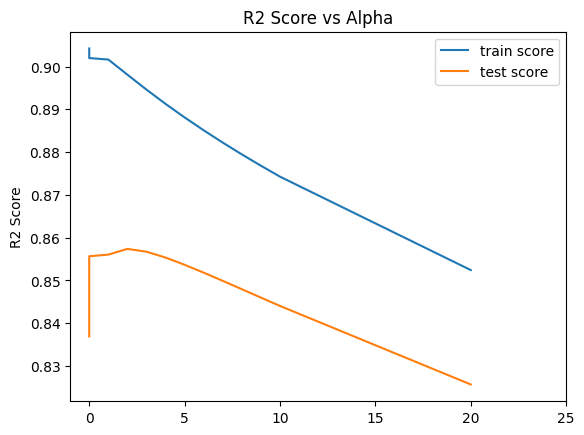

The optimum alpha is 2
The R2 Score of the model on the test dataset for optimum alpha is 0.8216212145920544
The RMSE of the model on the test dataset for optimum alpha is 0.05462559948331704


In [290]:
params = {'alpha': [0.0001, 0.001,0.005, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ,5000,10000]}

kf = KFold(n_splits=10)

model_cv = GridSearchCV(estimator=Ridge(random_state=10),param_grid=params,cv=kf,scoring='r2',return_train_score=True,verbose=1)
model_cv.fit(X_train_scaled_signi,y_train)
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results = cv_results[cv_results['param_alpha'] <= 30]
cv_results['param_alpha'] = cv_results['param_alpha'].astype('int32')


plt.plot(cv_results['param_alpha'], cv_results['mean_train_score'])
plt.plot(cv_results['param_alpha'], cv_results['mean_test_score'])
plt.ylabel('R2 Score')
plt.title("R2 Score vs Alpha")
plt.legend(['train score', 'test score'], loc='upper right')
plt.xticks(np.arange(0,30,5))
plt.show()

alpha = cv_results['param_alpha'].loc[cv_results['mean_test_score'].idxmax()]
print('The optimum alpha is',alpha)
ridge_final = Ridge(alpha=alpha,random_state=100)
ridge_final.fit(X_train_scaled_signi,y_train)
ridge_coef = ridge_final.coef_
y_test_pred = ridge_final.predict(X_test_scaled_signi)
print('The R2 Score of the model on the test dataset for optimum alpha is',r2_score(y_test, y_test_pred))
print('The RMSE of the model on the test dataset for optimum alpha is', mean_squared_error(y_test, y_test_pred,squared=False))

In [291]:
ridge_coeff = pd.DataFrame(np.atleast_2d(ridge_coef),columns=X_train_scaled_signi.columns)
ridge_coeff = ridge_coeff.T
ridge_coeff.rename(columns={0:'Ridge Co-Efficient'},inplace=True)
ridge_coeff.sort_values(by=['Ridge Co-Efficient'],ascending=False,inplace=True)
ridge_coeff.head(20)

,Ridge Co-Efficient
1stFlrSF,0.241401
GarageArea,0.109607
OverallCond,0.073024
LotArea,0.067747
HouseStyle_2.5Unf,0.067255
TotRmsAbvGrd,0.064746
HouseStyle_2Story,0.062038
LotFrontage,0.053171
FullBath,0.049527
HouseStyle_1.5Fin,0.044617


In [ ]:
# Top 20 features for Ridge regression

Fitting 10 folds for each of 11 candidates, totalling 110 fits


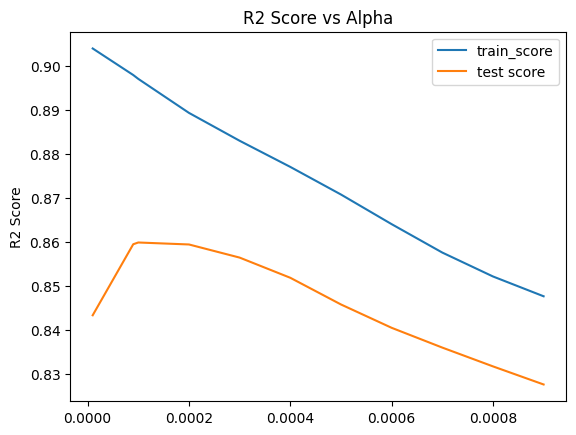

The optimum alpha is 0.0001
The R2 Score of the model on the test dataset for optimum alpha is 0.81940268131339
The RMSE of the model on the test dataset for optimum alpha is 0.05496424463964699


In [294]:
params = {'alpha': [0.00001, 0.00009, 0.0001, 0.0002, 0.0003, 0.0004, 0.0005, 0.0006, 0.0007, 0.0008, 0.0009 ]}
kf = KFold(n_splits=10)

model_cv2 = GridSearchCV(estimator=Lasso(random_state=10),param_grid=params,cv=kf,scoring='r2',return_train_score=True,verbose=1)
model_cv2.fit(X_train_scaled_signi,y_train)

cv_results2 = pd.DataFrame(model_cv2.cv_results_)

plt.plot(cv_results2['param_alpha'],cv_results2['mean_train_score'])
plt.plot(cv_results2['param_alpha'],cv_results2['mean_test_score'])
plt.ylabel('R2 Score')
plt.title('R2 Score vs Alpha')
plt.legend(['train_score','test score'],loc='upper right')
plt.show()


alpha = cv_results2['param_alpha'].loc[cv_results2['mean_test_score'].idxmax()]
print('The optimum alpha is',alpha)
lasso = Lasso(alpha=alpha,random_state=100)
lasso.fit(X_train_scaled_signi,y_train)
lasso_coef = lasso.coef_
y_test_pred = lasso.predict(X_test_scaled_signi)
print('The R2 Score of the model on the test dataset for optimum alpha is',r2_score(y_test, y_test_pred))
print('The RMSE of the model on the test dataset for optimum alpha is', mean_squared_error(y_test, y_test_pred,squared=False))

In [295]:
lasso_coeff = pd.DataFrame(np.atleast_2d(lasso_coef),columns=X_train_scaled_signi.columns)
lasso_coeff = lasso_coeff.T
lasso_coeff.rename(columns={0:'Lasso Co-Efficient'},inplace=True)
lasso_coeff.sort_values(by=['Lasso Co-Efficient'],ascending=False,inplace=True)
lasso_coeff.head(20)

,Lasso Co-Efficient
1stFlrSF,0.319503
GarageArea,0.109025
HouseStyle_2.5Unf,0.091791
HouseStyle_2Story,0.077691
OverallCond,0.075895
LotArea,0.068476
HouseStyle_1.5Fin,0.049487
LotFrontage,0.044453
CentralAir_Y,0.040330
FullBath,0.039087


In [ ]:
# Top 20 features for Lasso regression

In [ ]:
# We can see that r2 score for Ridge and Lasso are almost same approx 82.0 and follow factors affecting the model :
#Total area in square foot
#Total Garage Area
#Total Rooms
#Overall Condition
#Lot Area
#Centrally Air Conditioned
#Total Porch Area
#Kitchen Quality
#Basement Quality

In [299]:
# Building Ridge Model by doubling the value of alpha to 4
ridge_double = Ridge(alpha=4,random_state=100)
ridge_double.fit(X_train_scaled_signi,y_train)
ridge_double_coef = ridge_double.coef_
y_test_pred = ridge_double.predict(X_test_scaled_signi)
print('The R2 Score of the model on the test dataset for doubled alpha is',r2_score(y_test, y_test_pred))
print('The RMSE of the model on the test dataset for doubled alpha is', mean_squared_error(y_test, y_test_pred,squared=False))
ridge_double_coeff = pd.DataFrame(np.atleast_2d(ridge_double_coef),columns=X_train_scaled_signi.columns)
ridge_double_coeff = ridge_double_coeff.T
ridge_double_coeff.rename(columns={0: 'Ridge Doubled Alpha Co-Efficient'},inplace=True)
ridge_double_coeff.sort_values(by=['Ridge Doubled Alpha Co-Efficient'], ascending=False,inplace=True)
print('The most important predictor variables are as follows:')
ridge_double_coeff.head(20)

The R2 Score of the model on the test dataset for doubled alpha is 0.8222476942982999
The RMSE of the model on the test dataset for doubled alpha is 0.05452959050520473
The most important predictor variables are as follows:


,Ridge Doubled Alpha Co-Efficient
1stFlrSF,0.202030
GarageArea,0.103809
TotRmsAbvGrd,0.076042
OverallCond,0.065697
LotArea,0.059202
HouseStyle_2Story,0.054084
FullBath,0.054035
HouseStyle_2.5Unf,0.052495
LotFrontage,0.045946
BsmtFullBath,0.042373


In [300]:
# Building Lasso Model by doubling the value of alpha to 0.0002
lasso_double = Lasso(alpha=0.0002,random_state=100)
lasso_double.fit(X_train_scaled_signi,y_train)
lasso_double_coef = lasso_double.coef_
y_test_pred = lasso_double.predict(X_test_scaled_signi)
print('The R2 Score of the model on the test dataset for doubled alpha is',r2_score(y_test, y_test_pred))
print('The RMSE of the model on the test dataset for doubled alpha is', mean_squared_error(y_test, y_test_pred,squared=False))
lasso_double_coeff = pd.DataFrame(np.atleast_2d(lasso_double_coef),columns=X_train_scaled_signi.columns)
lasso_double_coeff = lasso_double_coeff.T
lasso_double_coeff.rename(columns={0: 'Lasso Doubled Alpha Co-Efficient'},inplace=True)
lasso_double_coeff.sort_values(by=['Lasso Doubled Alpha Co-Efficient'], ascending=False,inplace=True)
print('The most important predictor variables are as follows:')
lasso_double_coeff.head(20)

The R2 Score of the model on the test dataset for doubled alpha is 0.8189168050762153
The RMSE of the model on the test dataset for doubled alpha is 0.05503813245384374
The most important predictor variables are as follows:


,Lasso Doubled Alpha Co-Efficient
1stFlrSF,0.316258
GarageArea,0.107076
HouseStyle_2.5Unf,0.076554
HouseStyle_2Story,0.074855
OverallCond,0.072092
LotArea,0.056392
HouseStyle_1.5Fin,0.044178
CentralAir_Y,0.041397
TotRmsAbvGrd,0.041032
FullBath,0.039079


In [302]:
#Removing the 5 most important predictor variables from the incoming dataset
X_test_scaled_signi2 = X_test_scaled_signi.drop(['1stFlrSF','GarageArea','HouseStyle_2.5Unf','HouseStyle_2Story','OverallCond'],axis=1)
X_train_scaled_signi2 = X_train_scaled_signi.drop(['1stFlrSF','GarageArea','HouseStyle_2.5Unf','HouseStyle_2Story','OverallCond'],axis=1)

# Building Lasso Model with the new dataset
lasso3 = Lasso(alpha=0.0001,random_state=100)
lasso3.fit(X_train_scaled_signi2,y_train)
lasso3_coef = lasso3.coef_
y_test_pred = lasso3.predict(X_test_scaled_signi2)
print('The R2 Score of the model on the test dataset is',r2_score(y_test, y_test_pred))
print('The MSE of the model on the test dataset is', mean_squared_error(y_test, y_test_pred))
lasso3_coeff = pd.DataFrame(np.atleast_2d(lasso3_coef),columns=X_train_scaled_signi2.columns)
lasso3_coeff = lasso3_coeff.T
lasso3_coeff.rename(columns={0: 'Lasso Co-Efficient'},inplace=True)
lasso3_coeff.sort_values(by=['Lasso Co-Efficient'], ascending=False,inplace=True)
print('The most important predictor variables are as follows:')
lasso3_coeff.head(5)

The R2 Score of the model on the test dataset is 0.7817799340477367
The MSE of the model on the test dataset is 0.0036504290551054542
The most important predictor variables are as follows:


,Lasso Co-Efficient
TotRmsAbvGrd,0.201704
LotArea,0.154201
LotFrontage,0.105863
FullBath,0.084771
OpenPorchSF,0.064883
